<center> <h2><b>Machine Learning for Healthcare, Project 2: Interpretability and Explainability</b></h2> </center>
<h3><b>Part 2: Pneumonia Prediction Dataset</b></h3>

### Q1: Exploratory Data Analysis (4 Pts)

In [1]:
import numpy as np
import pandas as pd
import os
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
from transforms import *

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, MaxPool2D, Flatten, Dropout, BatchNormalization, SpatialDropout2D
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
from sklearn.utils import shuffle
from sklearn.metrics import classification_report, confusion_matrix

np.random.seed(42)

In [2]:
# Inspired by https://www.kaggle.com/code/madz2000/pneumonia-detection-using-cnn-92-6-accuracy

directories = ['NORMAL', 'PNEUMONIA']
img_size = 300

def get_image_data(data_dir):
    images = []
    label_values = []
    pneumonia_type = []

    for label in directories: 
        path = os.path.join(data_dir, label)
        class_num = directories.index(label)

        for img in os.listdir(path):
            try:
                img_arr = cv2.imread(os.path.join(path, img), cv2.IMREAD_GRAYSCALE) 
                resized_arr = cv2.resize(img_arr, (img_size, img_size))

                images.append(resized_arr / 255.0)  # Normalize the image
                label_values.append(class_num)

                if class_num == 1:  # PNEUMONIA
                    if 'bacteria' in img:
                        pneumonia_type.append(1)
                    elif 'virus' in img:
                        pneumonia_type.append(2)
                else:
                    pneumonia_type.append(0)
            
            except Exception as e:
                print(f"Error processing {img}: {e}")

    images = np.array(images).reshape(-1, img_size, img_size, 1)
    labels = np.array(label_values)  # 0 for NORMAL, 1 for PNEUMONIA
    pneumonia_type = np.array(pneumonia_type)
    return images, labels, pneumonia_type

X_train, y_train, type_train = get_image_data('chest_xray/train')
X_val, y_val, type_val = get_image_data('chest_xray/val')
X_test, y_test, type_test = get_image_data('chest_xray/test')

In [3]:
print("Training set label distribution:", np.unique(y_train, return_counts=True))
print("Validation set label distribution:", np.unique(y_val, return_counts=True))
print("Test set label distribution:", np.unique(y_test, return_counts=True))

Training set label distribution: (array([0, 1]), array([1341, 3875], dtype=int64))
Validation set label distribution: (array([0, 1]), array([8, 8], dtype=int64))
Test set label distribution: (array([0, 1]), array([234, 390], dtype=int64))


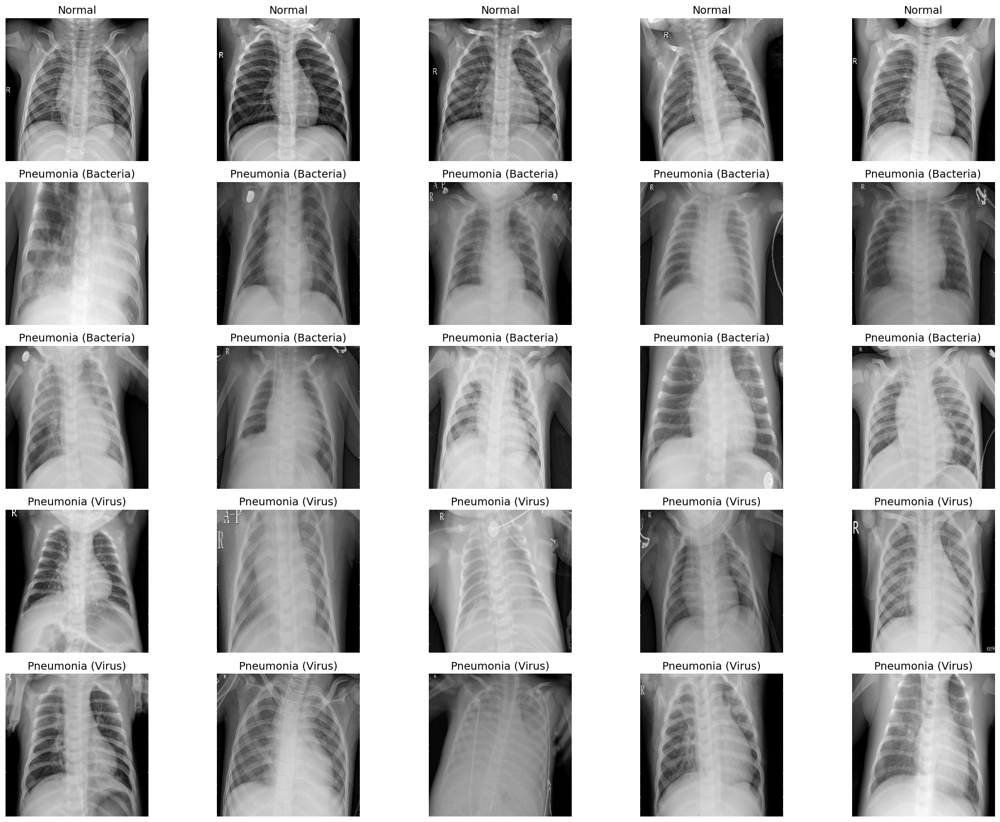

In [4]:
def visualize_samples():
    plt.figure(figsize=(20, 15))

    np.random.seed(42)
    normal_indices = np.random.choice(np.where(y_train == 0)[0], 5, replace=False)
    for i, idx in enumerate(normal_indices):
        plt.subplot(5, 5, i + 1)
        plt.imshow(X_train[idx].squeeze(), cmap='gray')
        plt.title("Normal", fontsize=14)
        plt.axis('off')

    bacteria_indices = np.random.choice(np.where(type_train == 1)[0], 5, replace=False)
    for i, idx in enumerate(bacteria_indices):
        plt.subplot(5, 5, i + 6)
        plt.imshow(X_train[idx].squeeze(), cmap='gray')
        plt.title("Pneumonia (Bacteria)", fontsize=14)
        plt.axis('off')

    bacteria_indices_extra = np.random.choice(np.where(type_train == 1)[0], 5, replace=False)
    for i, idx in enumerate(bacteria_indices_extra):
        plt.subplot(5, 5, i + 11)
        plt.imshow(X_train[idx].squeeze(), cmap='gray')
        plt.title("Pneumonia (Bacteria)", fontsize=14)
        plt.axis('off')

    virus_indices = np.random.choice(np.where(type_train == 2)[0], 5, replace=False)
    for i, idx in enumerate(virus_indices):
        plt.subplot(5, 5, i + 16)
        plt.imshow(X_train[idx].squeeze(), cmap='gray')
        plt.title("Pneumonia (Virus)", fontsize=14)
        plt.axis('off')

    virus_indices_extra = np.random.choice(np.where(type_train == 2)[0], 5, replace=False)
    for i, idx in enumerate(virus_indices_extra):
        plt.subplot(5, 5, i + 21)
        plt.imshow(X_train[idx].squeeze(), cmap='gray')
        plt.title("Pneumonia (Virus)", fontsize=14)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

visualize_samples()

#### Data preprocessing

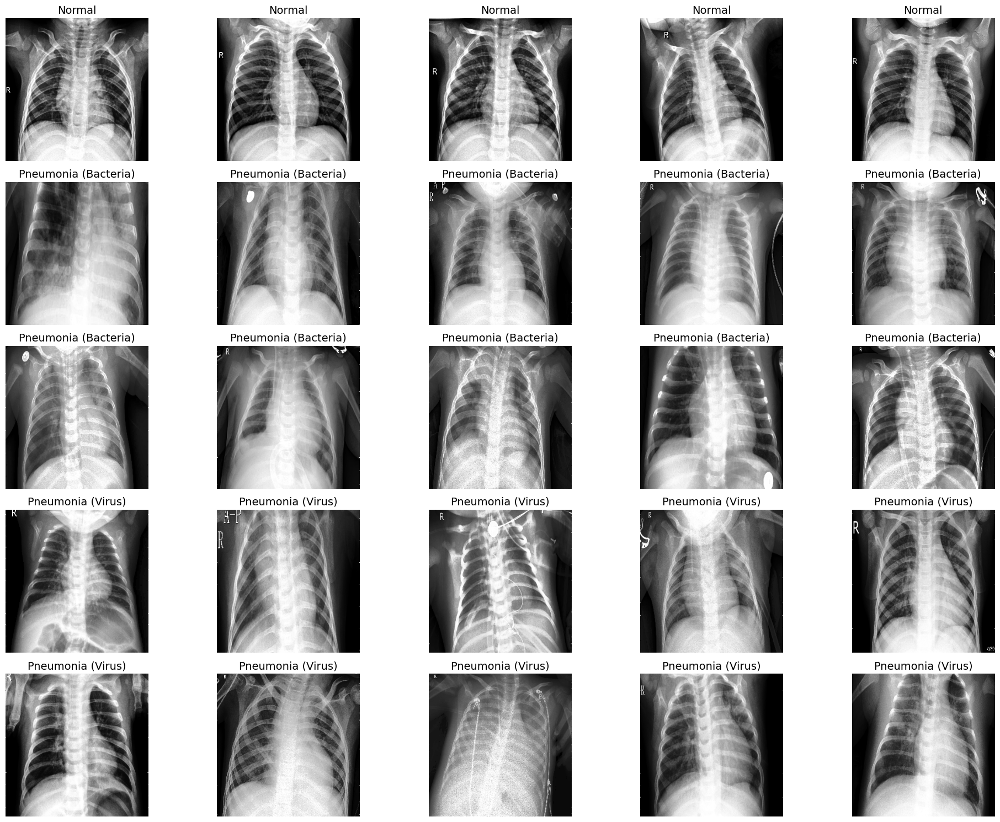

In [5]:
def apply_histogram_equalization(images):
    equalized_images = []
    for img in images:
        img = img.squeeze()
        equalized_img = cv2.equalizeHist((img * 255).astype(np.uint8))
        equalized_images.append(equalized_img / 255.0)
    return np.array(equalized_images).reshape(-1, img_size, img_size, 1)

X_train = apply_histogram_equalization(X_train)
X_val = apply_histogram_equalization(X_val)
X_test = apply_histogram_equalization(X_test)

visualize_samples()

#### Data augmentation

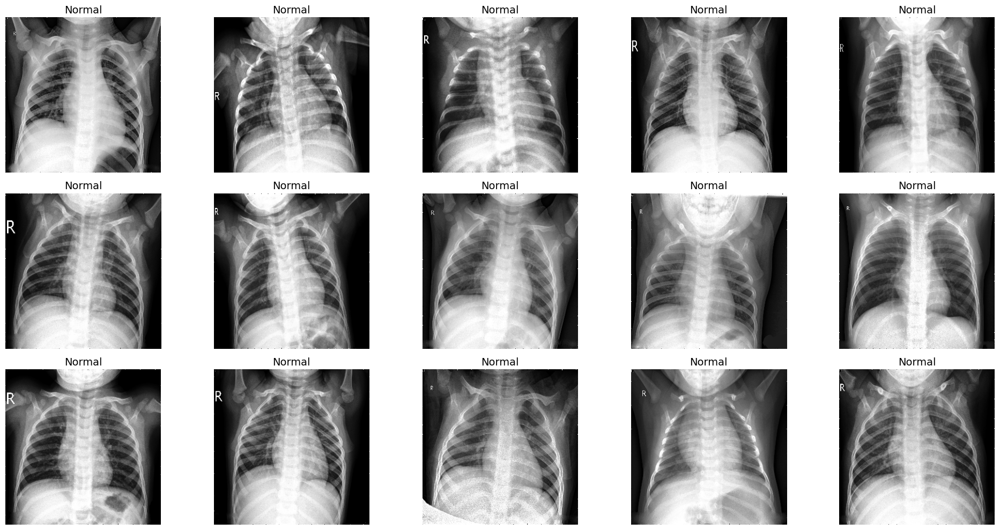

In [6]:
def visualize_normal_samples(y_train):
    plt.figure(figsize=(20, 10))
    normal_indices = np.where(y_train == 0)[0]

    for i in range(15):
        idx = normal_indices[-(i + 1)]  # Select the last indices
        plt.subplot(3, 5, i + 1)
        plt.imshow(X_train[idx].squeeze(), cmap='gray')
        plt.title("Normal", fontsize=14)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

visualize_normal_samples(y_train)

In [7]:
normal_count = np.sum(y_train == 0)
pneumonia_count = np.sum(y_train == 1)
images_to_generate = pneumonia_count - normal_count + 125
normal_indices = np.where(y_train == 0)[0]
pneumonia_indices = np.where(y_train == 1)[0]

augmented_images = []
augmented_labels = []

augmentation_pipeline = get_training_augmentation_pipeline()

for _ in range(images_to_generate):
    idx = np.random.choice(normal_indices)
    image = X_train[idx]

    augmented_image = augmentation_pipeline(image=image)['image']

    augmented_images.append(augmented_image)
    augmented_labels.append(0)  # Label for normal class

for _ in range(125):
    idx = np.random.choice(pneumonia_indices)
    image = X_train[idx]

    augmented_image = augmentation_pipeline(image=image)['image']

    augmented_images.append(augmented_image)
    augmented_labels.append(1)  # Label for pneumonia class

augmented_images = np.array(augmented_images)
augmented_labels = np.array(augmented_labels)

X_train = np.concatenate((X_train, augmented_images), axis=0)
y_train = np.concatenate((y_train, augmented_labels), axis=0)

After augmentation:
8000 8000
Label distribution:
(array([0, 1]), array([4000, 4000], dtype=int64))


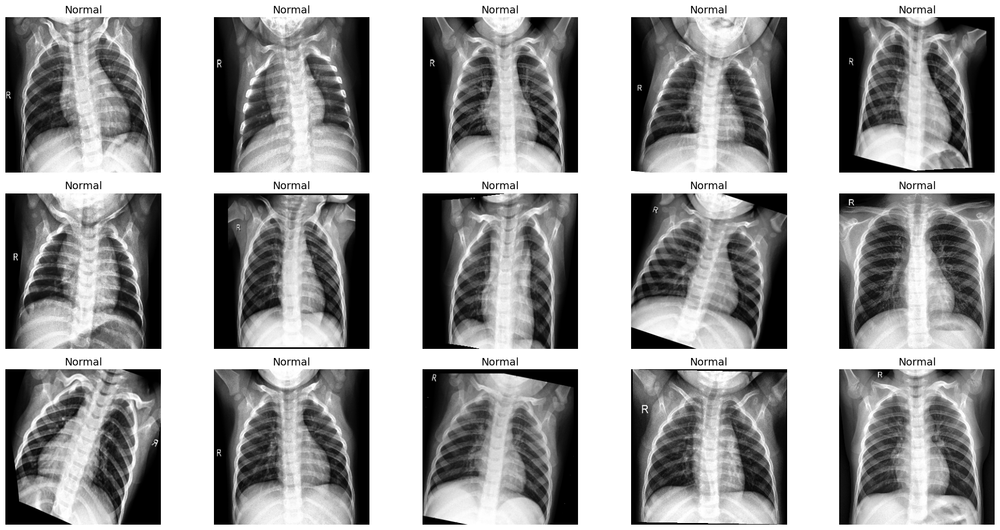

In [8]:
print("After augmentation:")
print(len(X_train), len(y_train))
print("Label distribution:")
print(np.unique(y_train, return_counts=True))

visualize_normal_samples(y_train)

### Q2: CNN Classifier (3 Pts)

In [9]:
# Inspired by https://www.kaggle.com/code/madz2000/pneumonia-detection-using-cnn-92-6-accuracy

def cnn_model():
    model = Sequential()
    model.add(Conv2D(16, (3, 3), strides=1, padding='same', activation='relu', input_shape=(img_size, img_size, 1)))
    model.add(BatchNormalization())
    model.add(SpatialDropout2D(0.5))
    model.add(MaxPool2D((2, 2), strides=2, padding='same'))
    model.add(Conv2D(32, (3, 3), strides=1, padding='same', activation='relu'))
    model.add(Dropout(0.5))
    model.add(SpatialDropout2D(0.5))
    model.add(BatchNormalization())
    model.add(MaxPool2D((2, 2), strides=2, padding='same'))
    model.add(Flatten())
    model.add(Dense(units=64, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(units=1, activation='sigmoid'))
    model.compile(optimizer="adam", loss='binary_crossentropy', metrics=['accuracy'])

    return model

model = cnn_model()
learning_rate_reduction = ReduceLROnPlateau(monitor='val_accuracy', patience=2, verbose=1, factor=0.3, min_lr=0.000001)
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

X_train, y_train = shuffle(X_train, y_train, random_state=42)

history = model.fit(
    X_train, y_train,
    batch_size=32,
    epochs=20,
    validation_data=(X_val, y_val),
    callbacks=[learning_rate_reduction, early_stopping],
)

C:\Users\afons\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/20
250/250 ━━━━━━━━━━━━━━━━━━━━ 84s 330ms/step - accuracy: 0.6992 - loss: 2.7389 - val_accuracy: 0.5625 - val_loss: 0.5925 - learning_rate: 0.0010
Epoch 2/20
250/250 ━━━━━━━━━━━━━━━━━━━━ 83s 330ms/step - accuracy: 0.8487 - loss: 0.3807 - val_accuracy: 0.8750 - val_loss: 0.3083 - learning_rate: 0.0010
Epoch 3/20
250/250 ━━━━━━━━━━━━━━━━━━━━ 83s 331ms/step - accuracy: 0.8992 - loss: 0.2553 - val_accuracy: 0.9375 - val_loss: 0.1851 - learning_rate: 0.0010
Epoch 4/20
250/250 ━━━━━━━━━━━━━━━━━━━━ 83s 330ms/step - accuracy: 0.9156 - loss: 0.2360 - val_accuracy: 0.8750 - val_loss: 0.2315 - learning_rate: 0.0010
Epoch 5/20
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step - accuracy: 0.8960 - loss: 0.2579
Epoch 5: ReduceLROnPlateau reducing learning rate to 0.0003000000142492354.
250/250 ━━━━━━━━━━━━━━━━━━━━ 82s 330ms/step - accuracy: 0.8960 - loss: 0.2578 - val_accuracy: 0.9375 - val_loss: 0.1725 - learning_rate: 0.0010
Epoch 6/20
250/250 ━━━━━━━━━━━━━━━━━━━━ 83s 331ms/step - accuracy: 0.921

In [10]:
y_probs = model.predict(X_test)
y_pred = (y_probs > 0.5).astype("int32").squeeze()

print(classification_report(y_test, y_pred, target_names=["Normal", "Pneumonia"]))

20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step
              precision    recall  f1-score   support

      Normal       0.96      0.56      0.71       234
   Pneumonia       0.79      0.98      0.88       390

    accuracy                           0.83       624
   macro avg       0.87      0.77      0.79       624
weighted avg       0.85      0.83      0.81       624



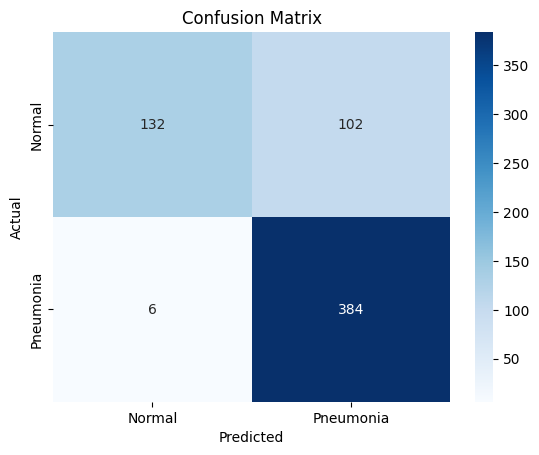

In [11]:
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Normal", "Pneumonia"], yticklabels=["Normal", "Pneumonia"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

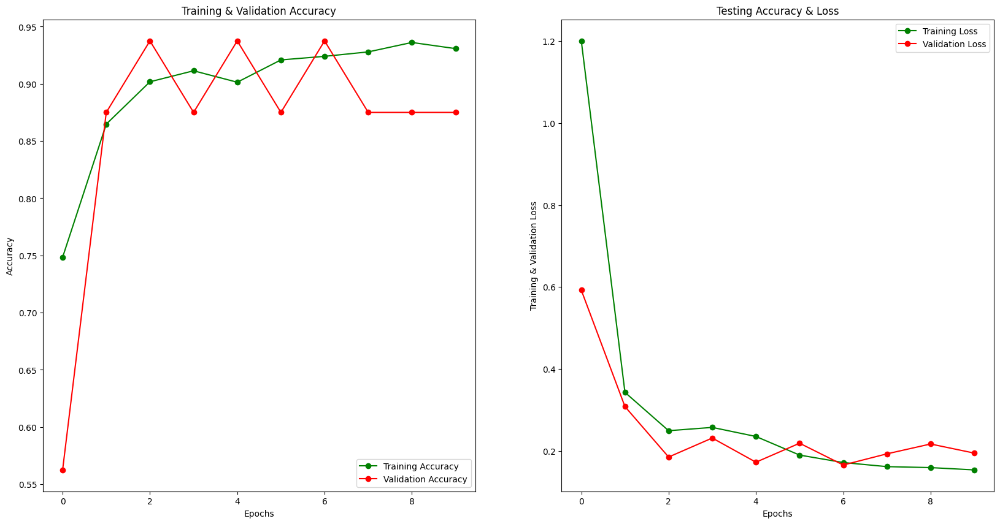

In [12]:
fig , ax = plt.subplots(1,2)
train_acc = history.history['accuracy']
train_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']
e = [i for i in range(len(train_acc))]
fig.set_size_inches(20,10)

ax[0].plot(e , train_acc , 'go-' , label = 'Training Accuracy')
ax[0].plot(e , val_acc , 'ro-' , label = 'Validation Accuracy')
ax[0].set_title('Training & Validation Accuracy')
ax[0].legend()
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Accuracy")

ax[1].plot(e , train_loss , 'g-o' , label = 'Training Loss')
ax[1].plot(e , val_loss , 'r-o' , label = 'Validation Loss')
ax[1].set_title('Testing Accuracy & Loss')
ax[1].legend()
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Training & Validation Loss")
plt.show()

In [13]:
correct = np.nonzero(y_pred == y_test)[0]
incorrect = np.nonzero(y_pred != y_test)[0]

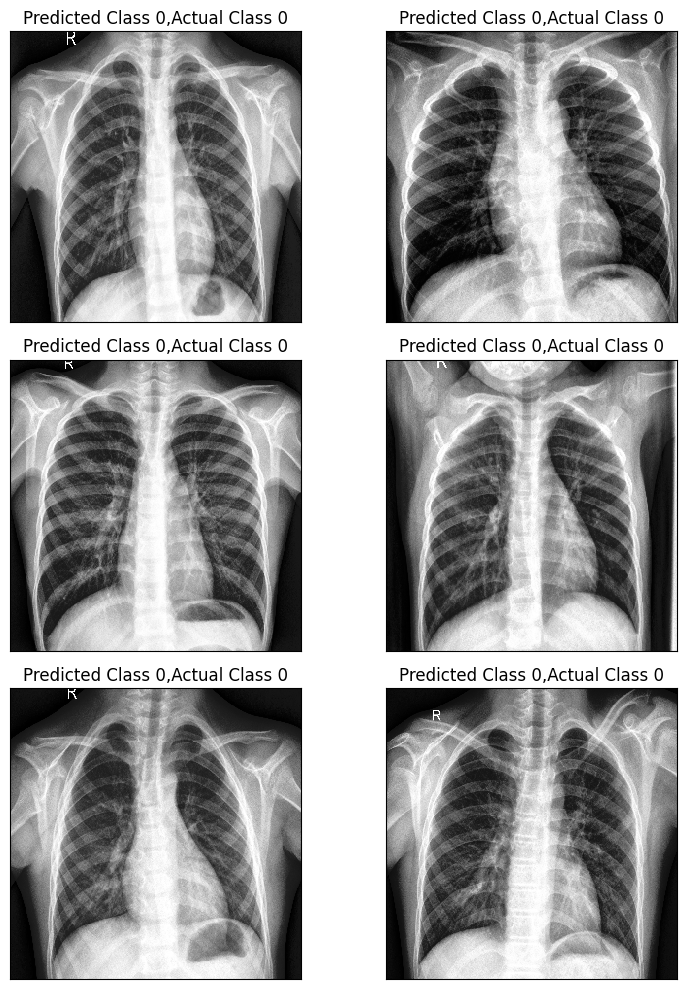

In [14]:
plt.figure(figsize=(10, 10))
i = 0
for c in correct[:6]:
    plt.subplot(3,2,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(X_test[c].reshape(img_size,img_size), cmap="gray", interpolation='none')
    plt.title("Predicted Class {},Actual Class {}".format(y_pred[c], y_test[c]))
    plt.tight_layout()
    i += 1

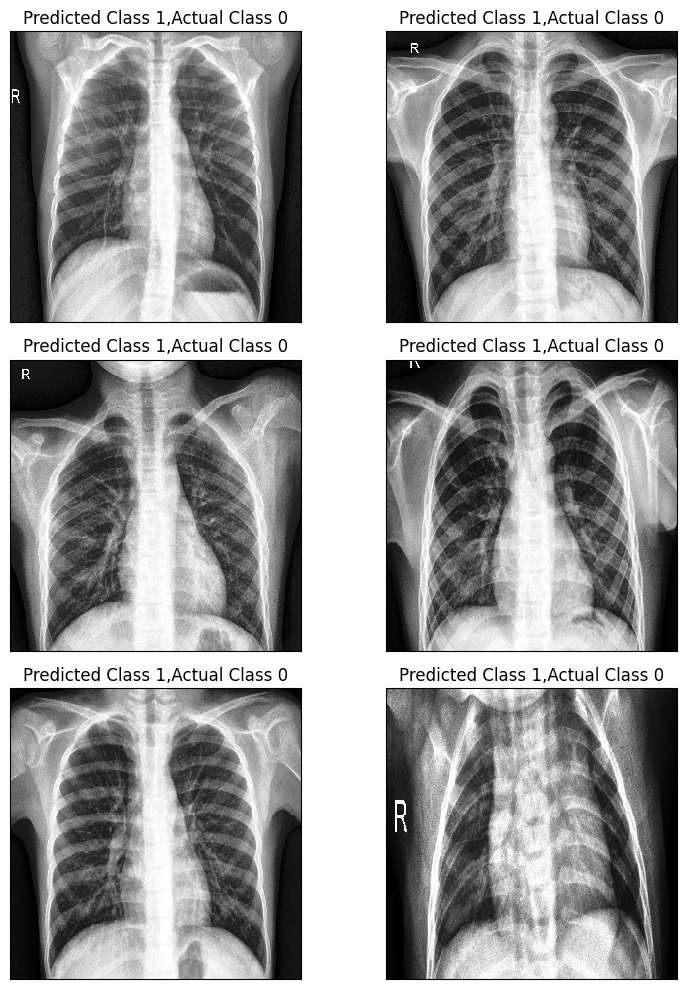

In [15]:
plt.figure(figsize=(10, 10))
i = 0
for c in incorrect[:6]:
    plt.subplot(3,2,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(X_test[c].reshape(img_size,img_size), cmap="gray", interpolation='none')
    plt.title("Predicted Class {},Actual Class {}".format(y_pred[c], y_test[c]))
    plt.tight_layout()
    i += 1

#### Q3: Integrated Gradients (5 Pts) 

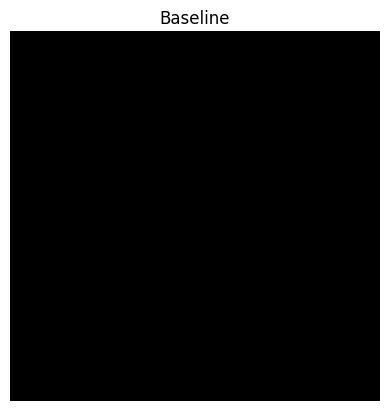

In [51]:
baseline = tf.zeros((img_size, img_size, 1), dtype=tf.float32)

# mean_image = tf.reduce_mean(X_train.astype(np.float32), axis=0)  # BAD RESULTS
# baseline = tf.convert_to_tensor(mean_image, dtype=tf.float32)

# baseline = tf.ones((img_size, img_size, 1), dtype=tf.float32) 

plt.imshow(baseline, cmap='gray', vmin=0, vmax=1)
plt.title("Baseline")
plt.axis('off')
plt.show()

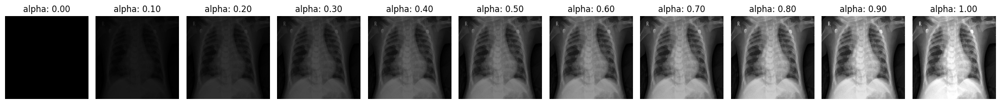

In [52]:
m_steps = 50
alphas = tf.linspace(start=0.0, stop=1.0, num=m_steps+1)

def interpolate_images(baseline, image, alphas):
  alphas_x = alphas[:, tf.newaxis, tf.newaxis, tf.newaxis]
  baseline_x = tf.expand_dims(baseline, axis=0)
  input_x = tf.expand_dims(image, axis=0)
  delta = input_x - baseline_x
  images = baseline_x +  alphas_x * delta
  return images

interpolated_images = interpolate_images(baseline=baseline, image=X_train[0].astype(np.float32), alphas=alphas)

fig = plt.figure(figsize=(20, 20))

i = 0
for alpha, image in zip(alphas[0::5], interpolated_images[0::5]):
  i += 1
  plt.subplot(1, len(alphas[0::5]), i)
  plt.title(f'alpha: {alpha:.2f}')
  plt.imshow(image[..., 0].numpy(), cmap='gray', vmin=0, vmax=1)
  plt.axis('off')

plt.tight_layout()

In [53]:
def compute_gradients(images, target_class):
    images = tf.convert_to_tensor(images, dtype=tf.float32)
    with tf.GradientTape() as tape:
        tape.watch(images)
        prob = model(images)

        if target_class == 1:
            prob = prob  # Probability of pneumonia (class 1)
        else:
            prob = 1 - prob  # Probability of normal (class 0)

    return tape.gradient(prob, images)

path_gradients = compute_gradients(images=interpolated_images, target_class=y_train[0])
prob = model(interpolated_images)
if y_train[0] == 1:
    pred_proba = prob  # Probability of pneumonia (class 1)
else:
    pred_proba = 1 - prob  # Probability of normal (class 0)

(0.0, 1.0)

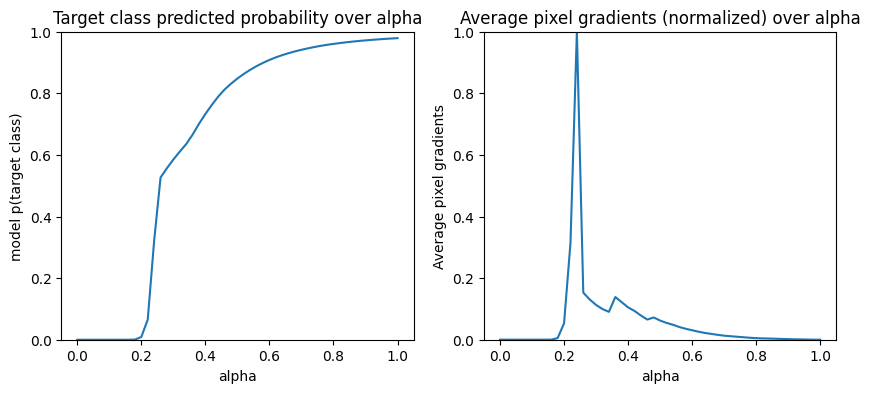

In [54]:
#@title
plt.figure(figsize=(10, 4))
ax1 = plt.subplot(1, 2, 1)
ax1.plot(alphas, pred_proba)
ax1.set_title('Target class predicted probability over alpha')
ax1.set_ylabel('model p(target class)')
ax1.set_xlabel('alpha')
ax1.set_ylim([0, 1])

ax2 = plt.subplot(1, 2, 2)
# Average across interpolation steps
average_grads = tf.reduce_mean(path_gradients, axis=[1, 2, 3])
# Normalize gradients to 0 to 1 scale. E.g., (x - min(x))/(max(x)-min(x))
average_grads_norm = (average_grads-tf.math.reduce_min(average_grads))/(tf.math.reduce_max(average_grads)-tf.reduce_min(average_grads))
ax2.plot(alphas, average_grads_norm)
ax2.set_title('Average pixel gradients (normalized) over alpha')
ax2.set_ylabel('Average pixel gradients')
ax2.set_xlabel('alpha')
ax2.set_ylim([0, 1])

In [55]:
def integral_approximation(gradients):
  # riemann_trapezoidal
  grads = (gradients[:-1] + gradients[1:]) / tf.constant(2.0)
  integrated_gradients = tf.math.reduce_mean(grads, axis=0)
  return integrated_gradients

ig = integral_approximation(gradients=path_gradients)

In [56]:
@tf.function
def one_batch(baseline, image, alpha_batch, target_class):
    # Generate interpolated inputs between baseline and input.
    interpolated_path_input_batch = interpolate_images(baseline=baseline, image=image, alphas=alpha_batch)

    # Compute gradients between model outputs and interpolated inputs.
    gradient_batch = compute_gradients(images=interpolated_path_input_batch, target_class=target_class)
    return gradient_batch

def integrated_gradients(baseline, image, target_class, m_steps=50, batch_size=32):
  # Generate alphas.
  alphas = tf.linspace(start=0.0, stop=1.0, num=m_steps+1)

  # Collect gradients.    
  gradient_batches = []
    
  # Iterate alphas range and batch computation for speed, memory efficiency, and scaling to larger m_steps.
  for alpha in tf.range(0, len(alphas), batch_size):
    from_ = alpha
    to = tf.minimum(from_ + batch_size, len(alphas))
    alpha_batch = alphas[from_:to]

    gradient_batch = one_batch(baseline, image, alpha_batch, target_class)
    gradient_batches.append(gradient_batch)
      
  # Concatenate path gradients together row-wise into single tensor.
  total_gradients = tf.concat(gradient_batches, axis=0)

  # Integral approximation through averaging gradients.
  avg_gradients = integral_approximation(gradients=total_gradients)

  # Scale integrated gradients with respect to input.
  integrated_gradients = (image - baseline) * avg_gradients

  return integrated_gradients

In [57]:
idx = 0

image = X_test[idx].astype(np.float32)
print("NORMAL" if y_test[idx] == 0 else "PNEUMONIA")

NORMAL


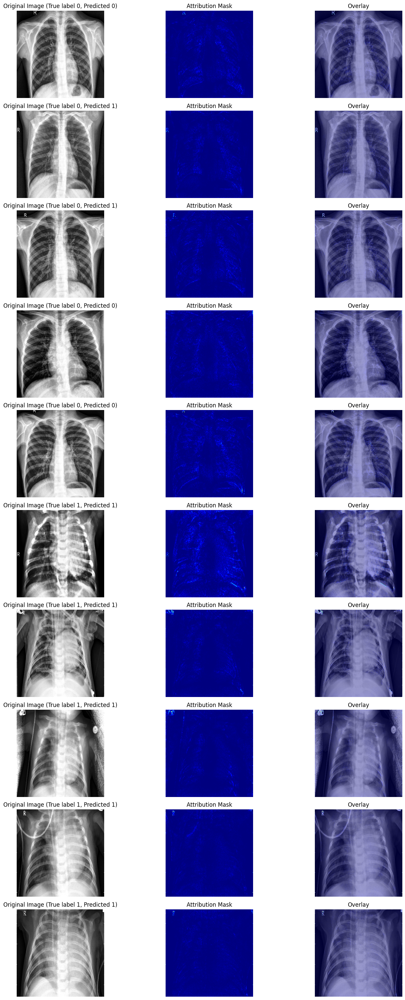

In [58]:
def plot_img_attributions(baseline, image_list, target_classes, predictions, m_steps=50, cmap=None, overlay_alpha=0.4):
    _, axs = plt.subplots(nrows=10, ncols=3, figsize=(15, 30))

    for i, (image, target_class, pred) in enumerate(zip(image_list, target_classes, predictions)):
        image = tf.convert_to_tensor(image, dtype=tf.float32)
        
        attributions = integrated_gradients(baseline=baseline, image=image, target_class=target_class, m_steps=m_steps)
        attribution_mask = tf.reduce_sum(tf.math.abs(attributions), axis=-1)
        
        row = i

        axs[row, 0].set_title(f'Original Image (True label {target_class}, Predicted {pred})')
        axs[row, 0].imshow(image, cmap='gray', vmin=0, vmax=1)
        axs[row, 0].axis('off')

        axs[row, 1].set_title('Attribution Mask')
        axs[row, 1].imshow(attribution_mask, cmap=cmap,)
        axs[row, 1].axis('off')

        axs[row, 2].set_title('Overlay')
        axs[row, 2].imshow(image, cmap='gray', vmin=0, vmax=1)
        axs[row, 2].imshow(attribution_mask, cmap=cmap, alpha=overlay_alpha)
        axs[row, 2].axis('off')

    plt.tight_layout()
    plt.show()

image_list = [X_test[0], X_test[1], X_test[2], X_test[3], X_test[4], 
              X_test[234], X_test[235], X_test[236], X_test[237], X_test[238]]
target_classes = [y_test[0], y_test[1], y_test[2], y_test[3], y_test[4], 
                  y_test[234], y_test[235], y_test[236], y_test[237], y_test[238]]
predictions = [y_pred[0], y_pred[1], y_pred[2], y_pred[3], y_pred[4], 
              y_pred[234], y_pred[235], y_pred[236], y_pred[237], y_pred[238]]

plot_img_attributions(baseline=baseline, image_list=image_list, target_classes=target_classes, predictions=predictions, m_steps=240, cmap='jet', overlay_alpha=0.4)

#### Q4: Grad-CAM (5 Pts)